In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white", context='poster')
import math

In [2]:
%load_ext autoreload
%autoreload 2


In [3]:
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [4]:
corder = ['C1', 'C2', 'C3', 'C4', 'C0']

In [5]:
morder = ['MIN', 'OVERFLOW', 'MIXOTROPH', 'EXOENZYME', 'ROS',]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
sns.color_palette(mpalette, n_colors=5)


[(0.4828677867260272, 0.6304330455306234, 0.761915371498953),
 (0.3668108554010799, 0.26404857724525643, 0.6464799165290824),
 (0.18488035509396164, 0.07942573027972388, 0.21307651648984993),
 (0.5566322903496934, 0.17269677158182117, 0.31423043195101424),
 (0.775907907306857, 0.5355421788246119, 0.42413367909988375)]

In [6]:
gorder = [ 'Strong', 'Sustained', 'Weak', 'Inhibited','Axenic' , 'Other']
gpalette = sns.color_palette('Set2', n_colors=4).as_hex() + ['black' , 'lightgrey']
sns.color_palette(gpalette)

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.0, 0.0, 0.0),
 (0.8274509803921568, 0.8274509803921568, 0.8274509803921568)]

In [7]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [8]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [9]:
refdf = pd.read_excel('ML_model/reference_final.xlsx')

In [10]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = 'results'

In [11]:
os.listdir(dpath)

['monte_ponly_clean_mse.csv.gz',
 'sensitivity_vmax2_df.csv.gz',
 'monte_ponly_clean_df.csv.gz',
 'monte_het_minmse.csv.gz',
 'sensitivity_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_sum.csv.gz',
 'monte_ponly_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_mse.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_df.csv.gz',
 'baseline_df.csv.gz',
 'results_old_26122023',
 'monte_het_clean_sum.csv.gz',
 'baseline_sum.csv.gz',
 'monte_strong_ponly_clean_df.csv.gz',
 'sensitivity_vmax2_sum.csv.gz',
 'monte_strong_ponly_sum.csv.gz',
 'sensitivity_vmax_mse.csv.gz',
 'monte_ponly_mse.csv.gz',
 'monte_ponly_sum.csv.gz',
 'monte_het_clean_mse.csv.gz',
 'monte_strong_ponly_df.csv.gz',
 'sensitivity_sum.csv.gz',
 'sensitivity_vmax2_mse.csv.gz',
 'sensitivity_vmax_df.csv.gz',
 'monte_het_mse.csv.gz',
 'monte_strong_ponly_clean_sum.csv.gz',
 'monte_het_sum.csv.gz',
 'monte_strong_ponly_mse.csv.gz',
 'monte_ponly_clean_sum.csv.gz',
 'sensitivity_ms

In [12]:
pro99_mode = False 
which_organism = 'all'
organism_to_tune = 'HET'
(var_names, init_var_vals, intermediate_names, calc_dydt, prepare_params_tuple
) = get_constants_per_organism(pro99_mode, which_organism)
    


In [13]:
var_names

['Bp',
 'Np',
 'Cp',
 'Bh',
 'Nh',
 'Ch',
 'DON',
 'RDON',
 'DIN',
 'DOC',
 'RDOC',
 'DIC',
 'ROS']

In [14]:
dpath = 'results'
sim_df = pd.read_csv(os.path.join(dpath,'monte_het_clean_df.csv.gz',))


# sim_df = pd.concat([
#     sim_df1,
#     sim_df2,
# ])

In [15]:
minmse_df = pd.read_csv(os.path.join(dpath,'monte_het_minmse.csv.gz',))



In [16]:
minmse_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,Sample,full name,Group,RMSE_Bptotal[N],RMSE_Bptotal[C],compare_points,RMSE,VPRO,VPRO_cluster,RMSE_clip
0,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,Sustained,0.984789,monte_EXOENZYME_100_monte_vpro_11_62_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,10C0,Marinovum 5F3,Weak,4.328551,45.455198,74.0,14.026943,vpro_11_62_EXOENZYME_C1,C1,14.026943
1,monte_EXOENZYME_100_monte_vpro_12_88_EXOENZYME...,Weak,0.933762,monte_EXOENZYME_100_monte_vpro_12_88_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,11A0,Roseovarius 5C3,Weak,4.621448,30.284159,74.0,11.830328,vpro_12_88_EXOENZYME_C2,C2,11.830328
2,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,Axenic,0.986309,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,1B0,Axenic,Axenic,2.342476,52.057268,74.0,11.042775,vpro_13_4_EXOENZYME_C3,C3,11.042775
3,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,Axenic,0.988574,monte_EXOENZYME_100_monte_vpro_13_4_EXOENZYME_...,lowN,all,EXOENZYME,h8519271514136708373,1B0,Axenic,Axenic,2.137782,47.880754,74.0,10.117244,vpro_13_4_EXOENZYME_C3,C3,10.117244
4,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,Axenic,0.973069,monte_EXOENZYME_100_monte_vpro_13_69_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,7B0,Sulfitobacter pseudonitzschiae,Sustained,2.548766,24.861325,74.0,7.960258,vpro_13_69_EXOENZYME_C1,C1,7.960258
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49344,monte_ROS_9_monte_vpro_93_82_ROS_C1_64_lowN_al...,Weak,0.988767,monte_ROS_9_monte_vpro_93_82_ROS_C1_64,lowN,all,ROS,h-8660846992299669535,11A0,Roseovarius 5C3,Weak,4.590178,37.560730,74.0,13.130516,vpro_93_82_ROS_C1,C1,13.130516
49345,monte_ROS_9_monte_vpro_96_60_ROS_C1_59_lowN_al...,Weak,0.990635,monte_ROS_9_monte_vpro_96_60_ROS_C1_59,lowN,all,ROS,h-8660846992299669535,10C0,Marinovum 5F3,Weak,2.031882,22.689852,74.0,6.789926,vpro_96_60_ROS_C1,C1,6.789926
49346,monte_ROS_9_monte_vpro_96_60_ROS_C1_66_lowN_al...,Weak,0.990635,monte_ROS_9_monte_vpro_96_60_ROS_C1_66,lowN,all,ROS,h-8660846992299669535,10C0,Marinovum 5F3,Weak,2.074992,22.349891,74.0,6.809981,vpro_96_60_ROS_C1,C1,6.809981
49347,monte_ROS_9_monte_vpro_97_23_ROS_C1_3_lowN_all...,Weak,0.990635,monte_ROS_9_monte_vpro_97_23_ROS_C1_3,lowN,all,ROS,h-8660846992299669535,10C0,Marinovum 5F3,Weak,4.263308,36.547564,74.0,12.482529,vpro_97_23_ROS_C1,C1,12.482529


In [17]:
df = pd.merge(minmse_df, 
                  sim_df[['run_id', 'Bptotal[N]','Bptotal[C]','Bhtotal[N]','Bhtotal[C]','day']], 
                  on='run_id', how='left')

In [18]:
df.columns

Index(['run_id', 'y_pred', 'max_prob', 'idx', 'media', 'which', 'model',
       'hash', 'Sample', 'full name', 'Group', 'RMSE_Bptotal[N]',
       'RMSE_Bptotal[C]', 'compare_points', 'RMSE', 'VPRO', 'VPRO_cluster',
       'RMSE_clip', 'Bptotal[N]', 'Bptotal[C]', 'Bhtotal[N]', 'Bhtotal[C]',
       'day'],
      dtype='object')

In [19]:
df = df.reset_index(drop=True)

In [20]:
runids = minmse_df.groupby(['model', ])['run_id'].sample(500)

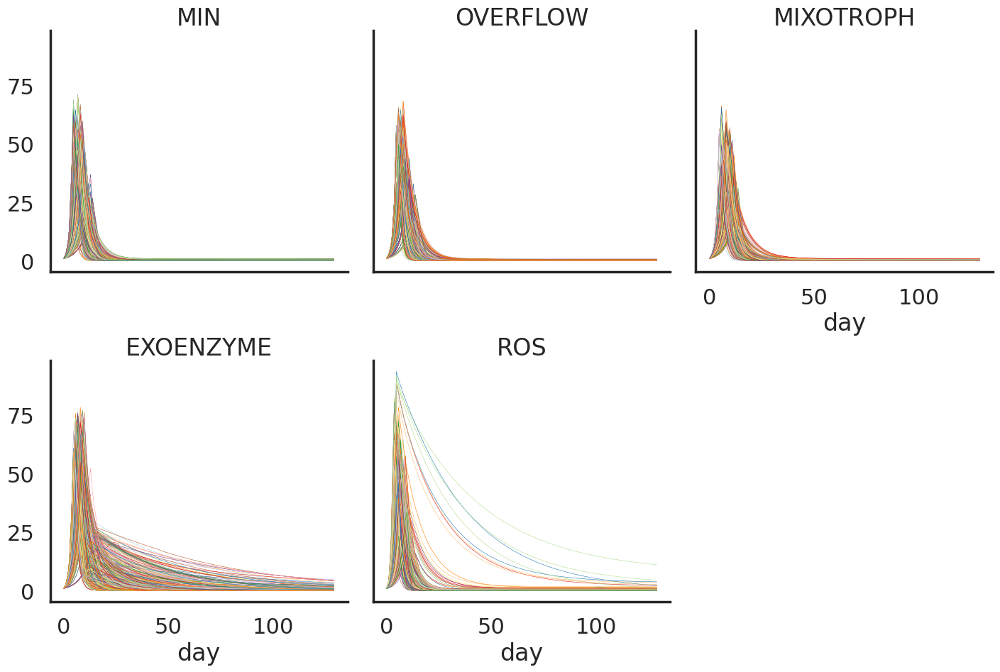

In [21]:
#runids = min_mse_df.loc[min_mse_df.Mode.isin(['Monte']),'run_id'].sample(500, ignore_index=True)
g = sns.relplot(
    data=df.loc[df.run_id.isin(runids)],
    x='day',
    y='Bptotal[N]',
    hue='run_id', #hue_order=gorder,
    kind='line', lw=0.4,
    estimator=None, units='run_id', palette='Paired',
    col='model', col_order=morder, col_wrap=3,
    legend=False,
        #aspect=1, height=3,
    #facet_kws=dict(margin_titles=True)

).set_titles(row_template='{row_name}', col_template='{col_name}').set(ylabel='', )
#.set(ylabel='umol N/L')
#plt.suptitle('Montecarlo')
#plt.subplots_adjust(hspace=0.1, wspace=0.1)

#g.set(yscale='log', ylim=(1e-1, 300))
plt.show()

In [22]:
runids = minmse_df.groupby(['model', 'Group', 'y_pred', 'VPRO_cluster'])['run_id'].sample(30, replace=True)

In [23]:
minmse_df.loc[minmse_df.run_id.isin(runids), ['model', 'Group', 'y_pred'] ] .value_counts()

model      Group      y_pred   
ROS        Weak       Weak         131
OVERFLOW   Weak       Weak         115
EXOENZYME  Axenic     Axenic       115
                      Sustained    113
ROS        Axenic     Weak         109
MIXOTROPH  Axenic     Axenic       106
EXOENZYME  Axenic     Other        104
MIN        Weak       Weak         104
OVERFLOW   Axenic     Weak          96
MIXOTROPH  Weak       Weak          77
EXOENZYME  Sustained  Axenic        76
MIXOTROPH  Weak       Axenic        76
MIN        Sustained  Weak          75
ROS        Axenic     Axenic        73
EXOENZYME  Weak       Axenic        71
MIXOTROPH  Axenic     Weak          70
EXOENZYME  Sustained  Sustained     67
           Weak       Weak          67
           Axenic     Weak          63
OVERFLOW   Axenic     Axenic        62
MIXOTROPH  Sustained  Axenic        60
MIN        Axenic     Axenic        59
           Sustained  Axenic        57
EXOENZYME  Weak       Sustained     57
           Strong     Sustained 

In [24]:
runids.nunique()

2612

In [25]:
sample_df = df.loc[df.run_id.isin(runids)]
#sample_df = sample_df.merge(df_predicted_classes, on=['run_id', 'model'], how='left')
sample_df

,run_id,y_pred,max_prob,idx,media,which,model,hash,Sample,full name,...,compare_points,RMSE,VPRO,VPRO_cluster,RMSE_clip,Bptotal[N],Bptotal[C],Bhtotal[N],Bhtotal[C],day
740,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,Axenic,0.865644,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,11A0,Roseovarius 5C3,...,74.0,11.307679,vpro_19_83_EXOENZYME_C1,C1,11.307679,0.892857,5.915179,28.571429,142.857143,0.000000
741,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,Axenic,0.865644,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,11A0,Roseovarius 5C3,...,74.0,11.307679,vpro_19_83_EXOENZYME_C1,C1,11.307679,1.452368,9.912488,38.334101,138.296327,1.081944
742,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,Axenic,0.865644,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,11A0,Roseovarius 5C3,...,74.0,11.307679,vpro_19_83_EXOENZYME_C1,C1,11.307679,2.179959,14.878647,37.921305,121.100418,2.164583
743,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,Axenic,0.865644,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,11A0,Roseovarius 5C3,...,74.0,11.307679,vpro_19_83_EXOENZYME_C1,C1,11.307679,2.712137,18.510870,37.700995,114.834524,2.747222
744,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,Axenic,0.865644,monte_EXOENZYME_100_monte_vpro_19_83_EXOENZYME...,lowN,all,EXOENZYME,h8519271514136708373,11A0,Roseovarius 5C3,...,74.0,11.307679,vpro_19_83_EXOENZYME_C1,C1,11.307679,3.955975,26.999991,37.323258,109.233007,3.754167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3651007,monte_ROS_9_monte_vpro_90_89_ROS_C0_41_lowN_al...,Axenic,0.444240,monte_ROS_9_monte_vpro_90_89_ROS_C0_41,lowN,all,ROS,h-8660846992299669535,1C0,Axenic,...,74.0,40.953218,vpro_90_89_ROS_C0,C0,40.953218,0.000643,0.006198,0.000309,0.001415,110.943750
3651008,monte_ROS_9_monte_vpro_90_89_ROS_C0_41_lowN_al...,Axenic,0.444240,monte_ROS_9_monte_vpro_90_89_ROS_C0_41,lowN,all,ROS,h-8660846992299669535,1C0,Axenic,...,74.0,40.953218,vpro_90_89_ROS_C0,C0,40.953218,0.000482,0.004635,0.000224,0.001027,115.845833
3651009,monte_ROS_9_monte_vpro_90_89_ROS_C0_41_lowN_al...,Axenic,0.444240,monte_ROS_9_monte_vpro_90_89_ROS_C0_41,lowN,all,ROS,h-8660846992299669535,1C0,Axenic,...,74.0,40.953218,vpro_90_89_ROS_C0,C0,40.953218,0.000416,0.003994,0.000190,0.000868,118.788889
3651010,monte_ROS_9_monte_vpro_90_89_ROS_C0_41_lowN_al...,Axenic,0.444240,monte_ROS_9_monte_vpro_90_89_ROS_C0_41,lowN,all,ROS,h-8660846992299669535,1C0,Axenic,...,74.0,40.953218,vpro_90_89_ROS_C0,C0,40.953218,0.000366,0.003502,0.000163,0.000747,121.777778


In [26]:
sample_df.run_id.nunique(), runids.nunique()

(2612, 2612)

In [27]:
refdf['ref_Bp[N]_clip'] = refdf['ref_Bp[N]'].clip(lower=0.5)
refdf['ref_Bp[C]_clip'] = refdf['ref_Bp[C]'].clip(lower=0.5)


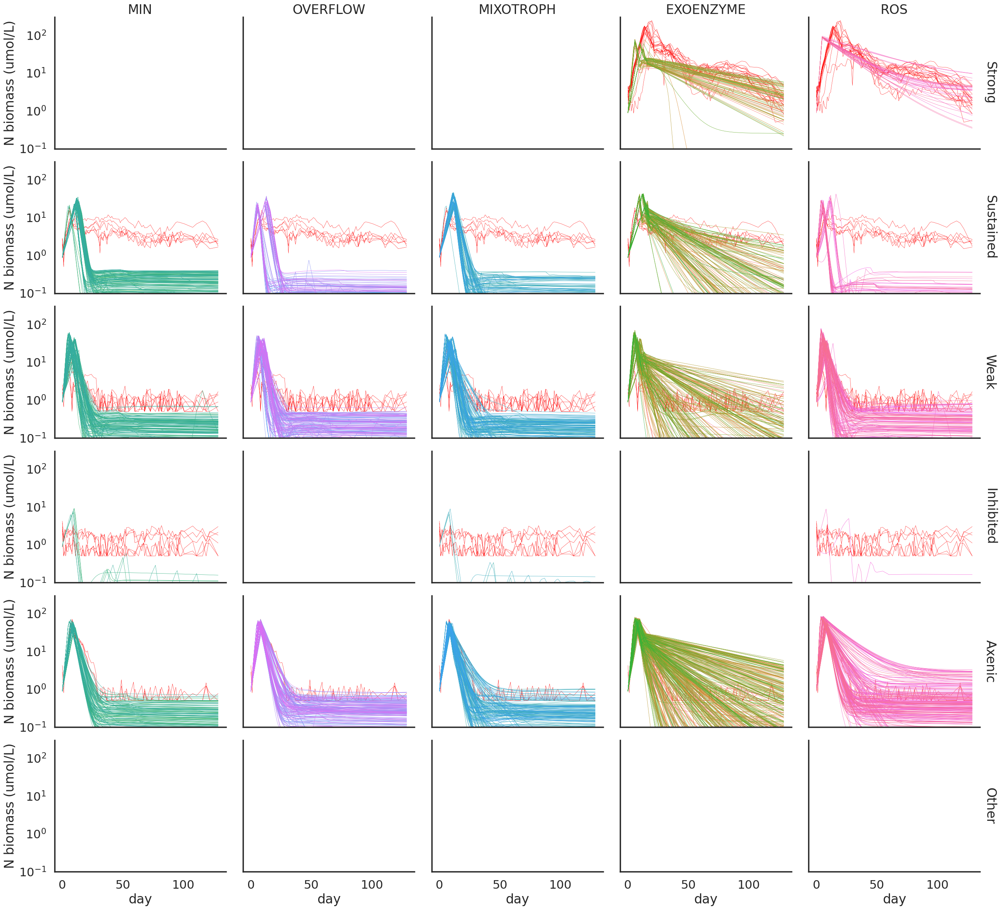

In [28]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bptotal[N]', lw=0.5,
        row='Group',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = minmse_df.loc[
                minmse_df.Group.isin([row_val]) &
                minmse_df.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[N]_clip',
                units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 300))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

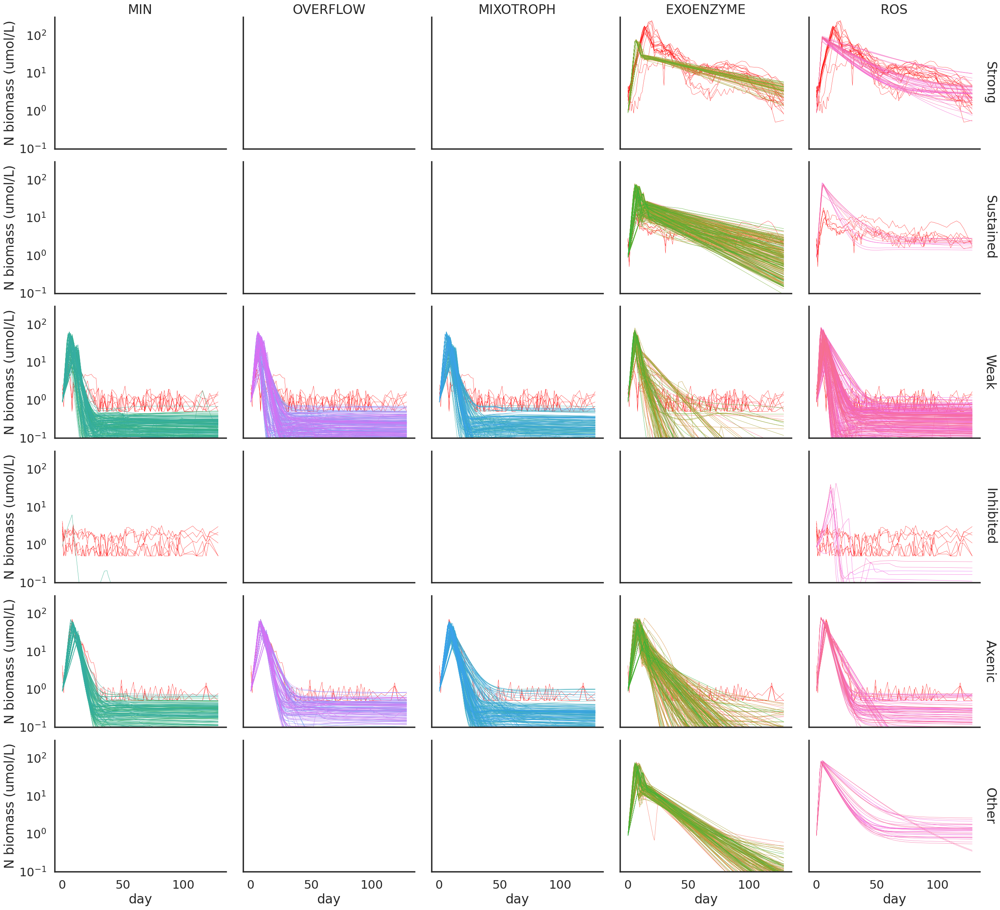

In [29]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bptotal[N]', lw=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = minmse_df.loc[
                minmse_df.y_pred.isin([row_val]) &
                minmse_df.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[N]_clip',
                units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 300))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

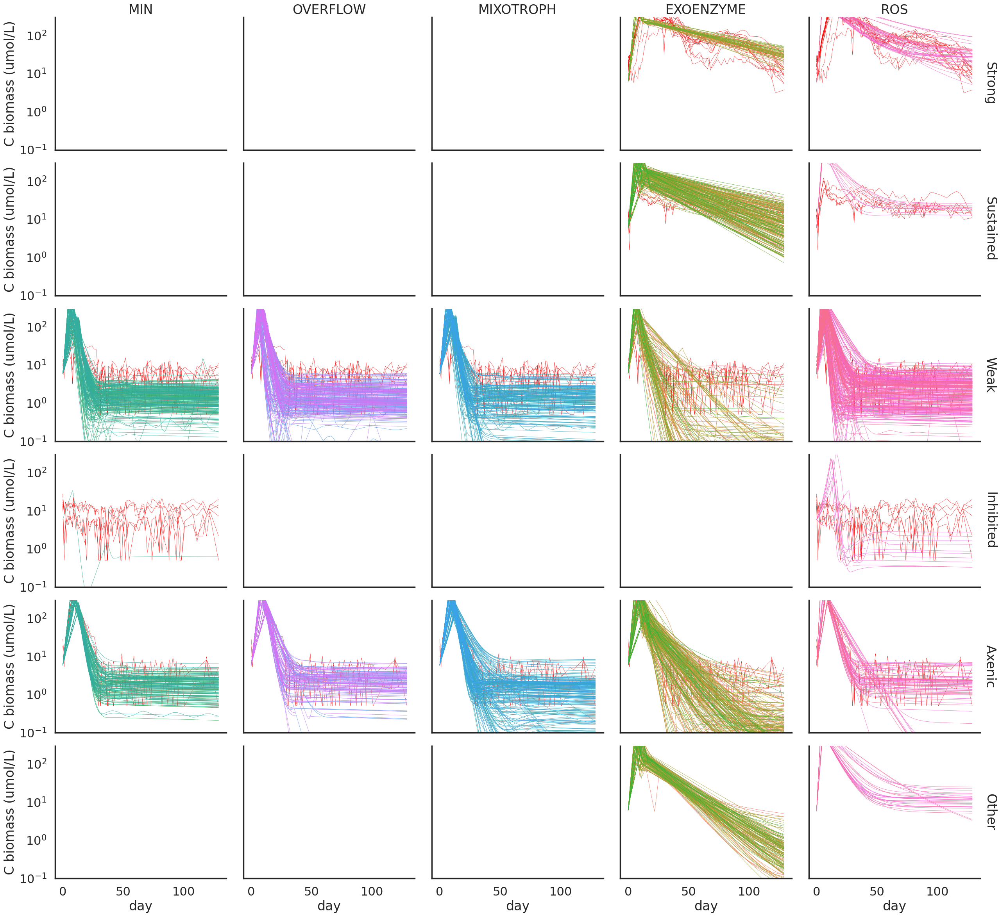

In [30]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bptotal[C]', lw=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = minmse_df.loc[
                minmse_df.y_pred.isin([row_val]) &
                minmse_df.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[C]_clip',
                units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 300))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='C biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

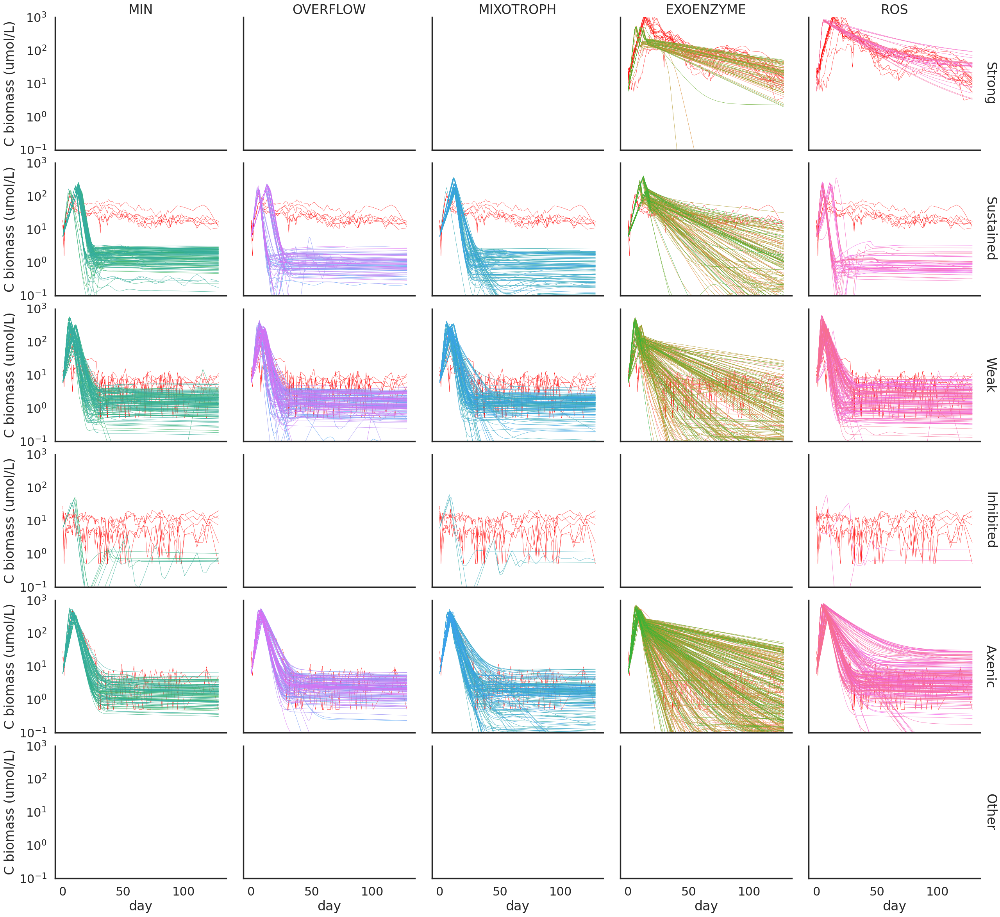

In [31]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bptotal[C]', lw=0.5,
        row='Group',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = minmse_df.loc[
                minmse_df.Group.isin([row_val]) &
                minmse_df.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[C]_clip',
                units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 1000))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='C biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

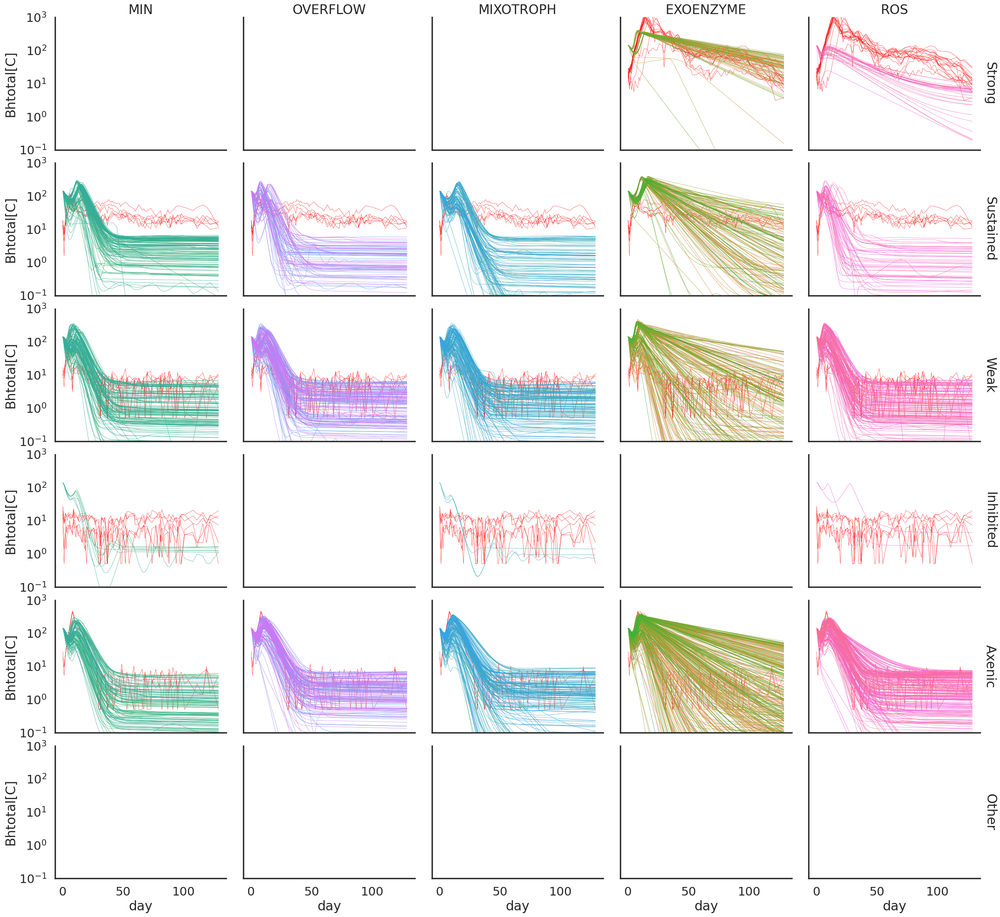

In [32]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bhtotal[C]', lw=0.5,
        row='Group',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = minmse_df.loc[
                minmse_df.Group.isin([row_val]) &
                minmse_df.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[C]_clip',
                units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 1000))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    #g.set(ylabel='C biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

NameError: name 'df_predicted_classes' is not defined

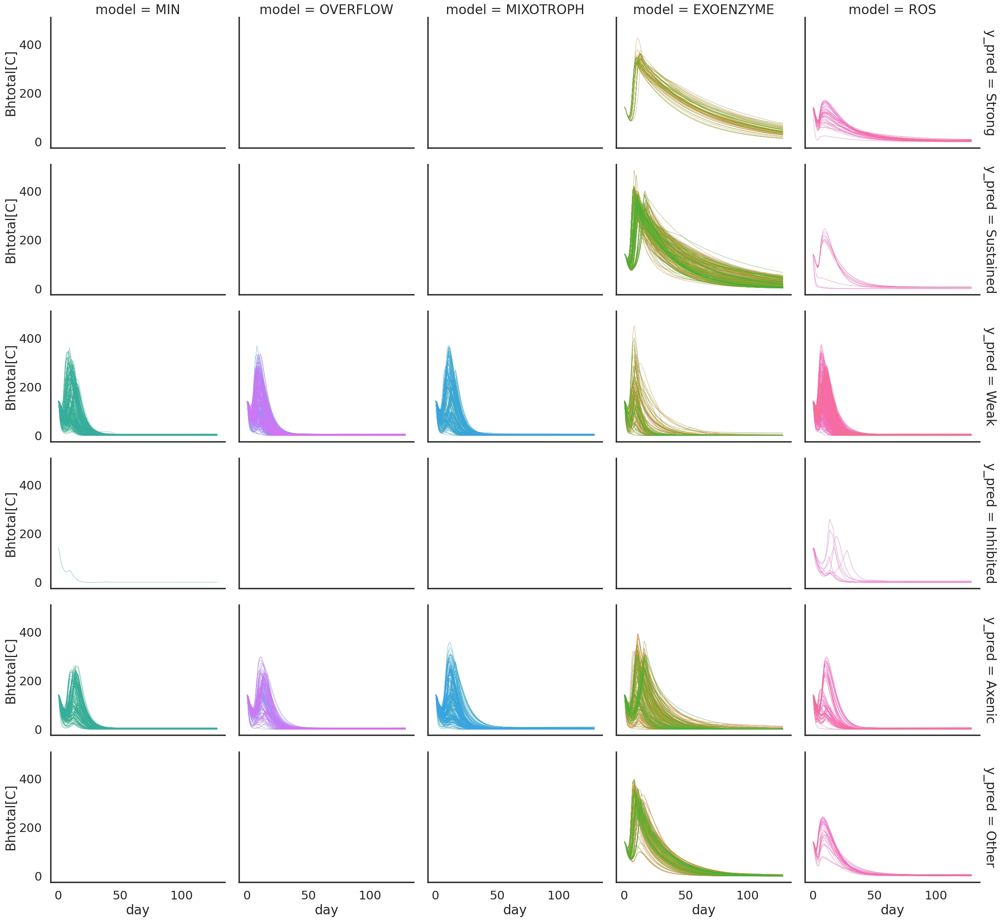

In [33]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bhtotal[C]', lw=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = df_predicted_classes.loc[
                df_predicted_classes.y_pred.isin([row_val]) &
                df_predicted_classes.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[N]_clip',
                units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 1000))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='HET C biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='run_id',
        x='day', y=f'Bhtotal[N]', lw=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=4, aspect=1.3,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        if row_val != 'Other':
            has_runs = df_predicted_classes.loc[
                df_predicted_classes.y_pred.isin([row_val]) &
                df_predicted_classes.model.isin([col_val]) 
            ]
            if has_runs.shape[0]>0:
                sns.lineplot(
                    data=refdf.loc[refdf['train_Group'].isin([row_val])],
                    x='day', y='ref_Bp[N]_clip',
                #units='Sample', estimator=None, 
                    ax=ax, lw=0.4, color='red',
                    errorbar=None,
                    zorder=-1,
                             legend=False
                            )
    g.set(yscale='log', ylim=(1e-1, 1000))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='HET N biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
sample_df.columns

In [ ]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='VPRO_cluster',palette='Greens_d',
        x='day', y=f'Bptotal[N]', lw=1, alpha=0.5,
        row='Group',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df.loc[
            sample_df.Group.isin([row_val]) &
            sample_df.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=sample_df.loc[
                    sample_df.Group.isin([row_val]) &
                    sample_df.model.isin([col_val]) 
                ],
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                hue='VPRO_cluster', palette='Oranges_d',
                x='day', y=f'Bhtotal[N]', lw=1,
                alpha=0.5,
                legend=False,
                zorder=-1,
                ax=ax,
            )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 color=HCOLOR,
#                 x='day', y=f'Bhtotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 #hue='compare_points', palette='Greens',
#                 color=PCOLOR,
#                 x='day', y=f'Bptotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
    g.set(yscale='log', ylim=(1e-1, 150))
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    #g.set(ylabel='N biomass (umol/L)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
    g = sns.relplot(
        data=sample_df,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        hue='VPRO_cluster',palette='Greens_d',
        x='day', y=f'Bptotal[N]', lw=1, alpha=0.5,
        row='y_pred',  row_order=gorder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df.loc[
            sample_df.y_pred.isin([row_val]) &
            sample_df.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=sample_df.loc[
                    sample_df.y_pred.isin([row_val]) &
                    sample_df.model.isin([col_val]) 
                ],
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                hue='VPRO_cluster', palette='Oranges_d',
                x='day', y=f'Bhtotal[N]', lw=1,
                alpha=0.5,
                legend=False,
                zorder=-1,
                ax=ax,
            )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 color=HCOLOR,
#                 x='day', y=f'Bhtotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 #hue='compare_points', palette='Greens',
#                 color=PCOLOR,
#                 x='day', y=f'Bptotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
    g.set(yscale='log', ylim=(1e-1, 150))
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    #g.set(ylabel='N biomass (umol/L)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
gorder

In [ ]:
for group in ['Strong', 'Sustained', 'Inhibited', ]:
    sample_df1 =  df.loc[df.y_pred.isin([group])]
          
    #runids = minmse_df.loc[minmse_df.Group.isin([g])].groupby(['model', 'Group', 'VPRO_cluster'])['run_id'].sample(50, replace=True)    
    g = sns.relplot(
        data=sample_df1,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        #hue='VPRO_cluster',palette='Greens_d',
        color=PCOLOR,
        x='day', y=f'Bptotal[N]', lw=1, alpha=0.5,
        row='VPRO_cluster',  row_order=corder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df1.loc[
            sample_df1.VPRO_cluster.isin([row_val]) &
            sample_df1.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                #hue='VPRO_cluster', palette='Oranges_d',
                color=HCOLOR,
                x='day', y=f'Bhtotal[N]', lw=1,
                alpha=0.5,
                legend=False,
                zorder=-1,
                ax=ax,
            )
            sns.lineplot(
                data=refdf.loc[refdf['Sample'].isin(data.Sample)],
                x='day', y='ref_Bp[N]_clip',
            #units='Sample', estimator=None, 
                ax=ax, lw=1, color='black',
                errorbar=None,
                zorder=2,
                         legend=False
                        )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 color=HCOLOR,
#                 x='day', y=f'Bhtotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 #hue='compare_points', palette='Greens',
#                 color=PCOLOR,
#                 x='day', y=f'Bptotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
   # g.set(yscale='log', ylim=(1e-1, 1000))
    g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    #g.set(ylabel='N biomass (umol/L)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.suptitle(group, y=1.05)      
    plt.show()

In [ ]:
gydf = minmse_df[['Group', 'y_pred']].value_counts().reset_index()
gydf = gydf.rename(columns={0:'count'})
gydf = gydf.loc[gydf.Group != gydf.y_pred]
gydf = gydf.loc[gydf['count'].ge(5)]

gydf

In [ ]:
for i in gydf.itertuples():
    print (i)

In [ ]:
for (idx, group,y_pred,c) in gydf.itertuples():
    print(group,y_pred, c)
    sample_df1 = df.loc[df.y_pred.isin([y_pred]) & df.Group.isin([group]) ]
    #if sample_df1.shape[0]>200:
    #    srunids = minmse_df.loc[df.y_pred.isin([y_pred]) & df.Group.isin([group]) 
    #                           ].groupby(['model', 'VPRO_cluster'])['run_id'].sample(50, replace=True)        
    #    sample_df1 = sample_df1.loc[sample_df1.run_id.isin(srunids)]
        
        
    g = sns.relplot(
            data=sample_df1,
            kind='line', 
            estimator=None, units='run_id',
            hue='model', palette=mpalette, hue_order=morder,
            #hue='run_id',
            x='day', y=f'Bptotal[C]', lw=0.5,
            col='model', col_order=morder,
            facet_kws=dict( margin_titles=True),
            legend=False,
            height=4, aspect=1.3,
        )
    for (col_val), ax in g.axes_dict.items():        
        has_runs = sample_df1.loc[
            sample_df1.model.isin([col_val]) 
        ]
        if has_runs.shape[0]>0:
            sns.lineplot(
                data=refdf.loc[refdf['train_Group'].isin([y_pred])],
                x='day', y='ref_Bp[C]_clip',
            units='Sample', estimator=None, ax=ax, lw=0.4, color='red',
                zorder=-1,
                         legend=False
                        )
    g.set(yscale='log', ylim=(1e-1, 1000))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)

    g.set(ylabel='C biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.suptitle(f'y_pred {y_pred}, Group {group} : {c}', y=1.05)    
    plt.show()

In [ ]:
for group in ['Strong', 'Sustained', ]:
    sample_df1 =  df.loc[df.Group.isin([group])]
          
    #runids = minmse_df.loc[minmse_df.Group.isin([g])].groupby(['model', 'Group', 'VPRO_cluster'])['run_id'].sample(50, replace=True)    
    g = sns.relplot(
        data=sample_df1,
        kind='line', 
        estimator=None, units='run_id',
        #hue='model', palette=mpalette, hue_order=morder,
        #hue='VPRO_cluster',palette='Greens_d',
        color=PCOLOR,
        x='day', y=f'Bptotal[N]', lw=1, alpha=0.5,
        row='VPRO_cluster',  row_order=corder,
        col='model', col_order=morder,
        facet_kws=dict( margin_titles=True),
        legend=False,
        height=3, aspect=1,
    )
    for (row_val, col_val), ax in g.axes_dict.items():        
        data=sample_df1.loc[
            sample_df1.VPRO_cluster.isin([row_val]) &
            sample_df1.model.isin([col_val]) 
        ]
        if data.shape[0]>0:
            sns.lineplot(
                data=data,
                estimator=None, units='run_id',
                #hue='model', palette=mpalette, hue_order=morder,
                #hue='VPRO_cluster', palette='Oranges_d',
                color=HCOLOR,
                x='day', y=f'Bhtotal[N]', lw=1,
                alpha=0.5,
                legend=False,
                zorder=-1,
                ax=ax,
            )
            sns.lineplot(
                data=refdf.loc[refdf['Sample'].isin(data.Sample)],
                x='day', y='ref_Bp[N]_clip',
            #units='Sample', estimator=None, 
                ax=ax, lw=1, color='black',
                errorbar=None,
                zorder=2,
                         legend=False
                        )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 color=HCOLOR,
#                 x='day', y=f'Bhtotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
#             sns.lineplot(
#                 data=sample_df.loc[
#                     sample_df.Group.isin([row_val]) &
#                     sample_df.model.isin([col_val]) 
#                 ],
#                 errorbar=None,
#                 #estimator=None, units='run_id',
#                 #hue='model', palette=mpalette, hue_order=morder,
#                 #hue='run_id', 
#                 #hue='compare_points', palette='Greens',
#                 color=PCOLOR,
#                 x='day', y=f'Bptotal[N]', lw=3,# alpha=0.2,
#                 legend=False,
#                 ax=ax,
#             )
    g.set(yscale='log', ylim=(1e-1, 150))
    #g.set(ylim=(0, 150))
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    #g.set(ylabel='N biomass (umol/L)')
    g.set(ylabel='')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.suptitle(group, y=1.05)      
    plt.show()

In [ ]:
sns.color_palette(sns.color_palette('Greens_d', n_colors=1) + sns.color_palette('Oranges_d',n_colors=1))


In [ ]:
ref_meta = refdf.loc[~refdf['train_Group'].isin(['Other'])][['train_Group','full name']].value_counts().reset_index()
ref_meta['train_Group'] = pd.Categorical(ref_meta['train_Group'], categories=gorder)
ref_meta = ref_meta.sort_values(by=['train_Group','full name'])


In [ ]:
    g = sns.relplot(
        data=refdf.loc[~refdf['train_Group'].isin(['Other'])],
        kind='line', 
        x='day', y='ref_Bp[N]_clip',
        units='Sample', estimator=None, 
        hue='train_Group', palette=gpalette, hue_order=gorder,
        col='full name', col_wrap=6, col_order=ref_meta['full name'],
        #facet_kws=dict( margin_titles=True),
        #legend=False,
        height=4, aspect=1.3,
    )
    g.set(yscale='log', ylim=(1e-1, 1000))
    #plt.subplots_adjust(hspace=0.1, wspace=0.1)
            
    g.set(ylabel='N biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
minmse_df[['Group','full name']].value_counts()

In [ ]:
stop

In [ ]:
sns.set_context('poster')
sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=3, order=morder,
    hue='model', hue_order=morder, palette=mpalette, 
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
mparams_df.variable.unique()

In [ ]:
variables_to_show_log = ['gammaDp', 'KINp', 'KICp',
      'Mp_day',  'VmaxINp_day_cell', 'VmaxICp_day_cell',
       'gamma_DON2DINp_day_cell', 'KONp', 'KOCp', 'VmaxONp', 'VmaxOCp',
       'VmaxOCp_day_cell', 'VmaxONp_day_cell', 'omegaP',
       'E_ROSp_day']

variables_to_show_nolog = ['Vmax/K ICp', 'Vmax/K INp', 'R* INp',
       'R* ICp', 'Vmax/Vmax Ip',]


In [ ]:
sns.set_context('poster')
sns.catplot(
    data=mparams_df.loc[mparams_df.variable.isin(variables_to_show_log)].reset_index(), 
    col='variable', x='value', y='model', col_wrap=3, order=morder,
    hue='model', hue_order=morder, palette=mpalette, sharex=False, 
    #facet_kws=dict(sharex=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xscale='log')


In [ ]:
sns.set_context('poster')
sns.catplot(
    data=mparams_df.loc[mparams_df.variable.isin(variables_to_show_nolog)].reset_index(), 
    col='variable', x='value', y='model', col_wrap=3, order=morder,
    hue='model', hue_order=morder, palette=mpalette, sharex=False, 
    #facet_kws=dict(sharex=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xscale='log')



In [ ]:
sns.set_context('poster')
sns.displot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC',  col_wrap=3,
    hue='model', hue_order=morder, palette=mpalette, multiple='stack',
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
df.columns

In [ ]:
mdf1 = df.melt(
    id_vars=['t', 'day', 'run_id', 'id', 'media', 'which', 'model', 'hash', 'idx'], 
    value_vars=var_names)

In [ ]:
mdf2 = df.melt(
    id_vars=['t', 'day', 'run_id', 'id', 'media', 'which', 'model', 'hash', 'idx'], 
    value_vars=intermediate_names)

In [ ]:
for med in media_order:
        rankcol = 'lrank'
        mrows = mean_scores.loc[mean_scores[rankcol].le(5)]

        g = sns.relplot(
            data=mdf1.loc[mdf1.idx.isin(mrows.idx) & mdf1.media.isin([med])],
            kind='line', 
            estimator=None, units='idx',
            x='day', y='value', 
            col='variable', lw=1, col_wrap=5,
            hue='model', hue_order=morder, palette=mpalette,
            facet_kws=dict( margin_titles=True, sharey=False),

        )
        g.set_titles(col_template='{col_name}', row_template='{row_name}')
        plt.suptitle(f'{med} simulation results (top models)', y=1.03)

In [ ]:
for med in media_order:
        rankcol = 'lrank'
        mrows = mean_scores.loc[mean_scores[rankcol].le(5)]

        g = sns.relplot(
            data=mdf2.loc[mdf2.idx.isin(mrows.idx) & mdf2.media.isin([med])],
            kind='line', 
            estimator=None, units='idx',
            x='day', y='value', 
            col='variable', lw=1, col_wrap=5,
            hue='model', hue_order=morder, palette=mpalette,
            facet_kws=dict( margin_titles=True, sharey=False),

        )
        g.set_titles(col_template='{col_name}', row_template='{row_name}')
        plt.suptitle(f'{med} intermediate (top models)', y=1.03)

In [ ]:
        rankcol = 'lrank'
        mrows = mean_scores.loc[mean_scores[rankcol].le(5)]

        g = sns.relplot(
            data=mdf2.loc[mdf2.idx.isin(mrows.idx) & mdf2.variable.isin(['QCp'])],
            kind='line', 
            estimator=None, units='idx',
            x='day', y='value', 
            col='media', lw=1, #col_wrap=5,
            hue='model', hue_order=morder, palette=mpalette,
            #facet_kws=dict( margin_titles=True, sharey=False),
            legend=False,

        )
        g.set_titles(col_template='{col_name}', row_template='{row_name}')
        g.set(ylabel='C/N ratio')
        plt.suptitle(f'C/N ratio (top models)', y=1.03)

In [ ]:
        rankcol = 'lrank'
        mrows = mean_scores.loc[mean_scores[rankcol].le(5)]

        g = sns.relplot(
            data=mdf2.loc[mdf2.variable.isin(['QCp'])],
            kind='line', 
            estimator=None, units='idx',
            x='day', y='value', 
            col='media', lw=1, #col_wrap=5,
            hue='model', hue_order=morder, palette=mpalette,
            #facet_kws=dict( margin_titles=True, sharey=False),
            legend=False,

        )
        g.set_titles(col_template='{col_name}', row_template='{row_name}')
        g.set(ylabel='C/N ratio')
        plt.suptitle(f'C/N ratio (top models)', y=1.03)

In [ ]:
    min_params_to_update, _, _ = get_param_tuning_values('MIN', organism_to_tune)


In [ ]:
from scipy.stats import pearsonr

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

In [ ]:
def _get_corrs(model):
    mrows = min_rows 
    cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

    tmp = mparams_df.loc[
                    mparams_df.idx.isin(mrows.idx) &
                    mparams_df.model.isin([model]) 
                ]

    mtmp = tmp.pivot_table(index='idx', columns='variable', values='FC')[cur_params_to_update]
    corr_df = mtmp.corr()
    trimask = np.triu(np.ones_like(corr_df, dtype=bool))    
    corr_unstack = corr_df.mask(trimask).unstack().dropna()
    res_df = corr_unstack.rename_axis(['var1', 'var2']).reset_index().rename(columns={0:'correlation'})
    res_df['model'] = model
    return res_df
corr_df = pd.concat([_get_corrs(m) for m in morder ], ignore_index=True)
corr_df

In [ ]:
corr_df['pair'] = corr_df.var1 +' / ' +  corr_df.var2

In [ ]:
corr_df_filtered = corr_df.loc[(corr_df.correlation > 0.2) | (corr_df.correlation < -0.2)]

pcorr_df = corr_df.loc[corr_df.pair.isin(corr_df_filtered.pair)].pivot_table(index='pair', columns=['model',  ], 
                               values='correlation', fill_value=3, dropna=True)
pcorr_df = pcorr_df.reindex(columns=pcorr_df.columns.reindex(morder, level=0)[0])
sns.set_context('talk')

g = sns.clustermap(
    pcorr_df, 
    cmap='coolwarm', 
    mask=pcorr_df==3,
    col_cluster=False,
    annot=True,
    
)
ax = g.ax_heatmap  
for i in [2,4,6,8]:
    ax.axvline(i, c='black')


In [ ]:
mparams_df.variable.unique()

In [ ]:
additional_variables

In [ ]:
min_params_to_update

In [ ]:
from scipy.cluster.vq import whiten
from scipy.cluster.hierarchy import fcluster, linkage
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram

#def _get_clusters(model):
model='MIN'
cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

variables = cur_params_to_update + additional_variables

mtmp = mparams_df.pivot_table(index=['model','idx'], columns='variable', values='value')[variables]
mtmp
mtmp = np.log2(mtmp)
mtmp_transformed = ((mtmp - mtmp.mean()) / mtmp.std())
# # standardize (normalize) the features
data = whiten(mtmp_transformed)

# Compute the distance matrix
matrix = linkage(
    data,
    method='ward',
    #method='single',
    #method='centroid',
    #method='complete',
    metric='euclidean'
    )

# Assign cluster labels
labels = fcluster(
    matrix, 5, 
    criterion='maxclust'
    )
labels_series = pd.Series(labels, index= mtmp.index.get_level_values(1))
mparams_df['cluster'] = mparams_df.idx.map(labels_series)

lut = dict(zip(np.unique(labels), sns.color_palette('Set2', n_colors=np.max(labels)+1).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 
sns.clustermap(
    data=mtmp_transformed, #col_cluster=False, 
    row_linkage=matrix, 
    cmap='coolwarm',
    row_colors=row_colors,
    yticklabels=False,
              )

dendrogram(matrix, no_labels=True, orientation='left')
plt.show()
# Create DataFrame
#mtmp['labels'] = labels
    
#mtmp = _get_clusters('MIN')
# corr_df = pd.concat([_get_corrs(m,l) for m in morder for l in ('RMSE', 'lRMSE')], ignore_index=True)
# corr_df

In [ ]:
mtmp1 = mtmp_transformed.copy()
mtmp1['cluster'] = labels
mtmp_melt = mtmp1.reset_index().melt(id_vars=['idx', 'model', 'cluster'])
sns.set_context('poster')
g = sns.catplot(
    data=mtmp_melt, 
    col='variable', y='value', x='cluster', #fill=None,#hue='cluster', #col_wrap=3,
    #hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
    kind='box', dodge=False, col_wrap=5,color='white',
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.map_dataframe(sns.stripplot, y='value', x='cluster', 
    hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
     )


In [ ]:
sns.set_context('paper')
sns.heatmap(mtmp_transformed.groupby(labels).mean().T, annot=True, cmap='coolwarm')
sns.set_context('poster')


In [ ]:
labels_series = pd.Series(labels, index= mtmp.index.get_level_values(1))

In [ ]:
labels_series = pd.Series(labels, index= mtmp.index.get_level_values(1))
mparams_df['cluster'] = mparams_df.idx.map(labels_series)

In [ ]:
mparams_df['cluster'].value_counts()

In [ ]:
mtmp

kmeans.labels_

In [ ]:
from scipy.cluster.hierarchy import dendrogram

dendrogram(matrix, no_labels=True, orientation='left')
plt.show()

In [ ]:
lut = dict(zip(np.unique(labels), sns.color_palette('Set2', n_colors=np.max(labels)+1).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


In [ ]:
mtmp

In [ ]:
sns.clustermap(
    data=mtmp, col_cluster=False, row_linkage=matrix, 
    cmap='coolwarm',
    row_colors=row_colors,
    yticklabels=False,
              )

In [ ]:
mtmp1 = mtmp.copy()
mtmp1['labels'] = labels
mtmp1.reset_index(inplace=True)
g = sns.pairplot(
    data=mtmp1, hue='labels', palette='Set2',
    plot_kws=dict(marker="+", linewidth=2, alpha=0.5),
)
g.map_lower(sns.kdeplot, levels=4)


In [ ]:
sns.catplot(
    data=mtmp1,
    col='labels', 
    y='model', hue='model', hue_order=morder, order=morder, palette=mpalette,dodge=False,
    kind='count',
    legend=False,
).set_titles(col_template='cluster {col_name}', row_template='{row_name}')

In [ ]:
sns.set_context('poster')
sns.displot(
    data=mparams_df.loc[~mparams_df['cluster'].isna() & mparams_df.variable.isin(min_params_to_update)], 
    col='variable', row='cluster', x='FC',  #col_wrap=3,
    hue='model', hue_order=morder, palette=mpalette, multiple='stack',
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['cluster'].isna() & mparams_df.variable.isin(min_params_to_update)], 
    col='variable', y='FC', x='cluster', #fill=None,#hue='cluster', #col_wrap=3,
    #hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
    kind='box', dodge=False, col_wrap=3,color='white',
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.map_dataframe(sns.stripplot, y='FC', x='cluster', 
    hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
     )


In [ ]:
sns.set_context('poster')
sns.displot(
    data=mparams_df.loc[~mparams_df['cluster'].isna() & 
                        ~mparams_df.variable.isin(min_params_to_update) &
                        ~mparams_df.FC.isna()
                       ], 
    col='variable', row='cluster', x='FC',  #col_wrap=3,
    hue='model', hue_order=morder, palette=mpalette, multiple='stack',
    facet_kws=dict(sharex=False, margin_titles=True),
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
        sns.set_context('poster')
    
        mrows = min_rows 
        for model in morder:
            cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)
            tmp = mparams_df.loc[
                mparams_df.idx.isin(mrows.idx) &
                mparams_df.model.isin([model]) &
                mparams_df.variable.isin(cur_params_to_update) 
            ].copy()
            mtmp = tmp.pivot_table(index='idx', columns='variable', values='FC')[cur_params_to_update] #fill_value=0)
            #print(l, model, mtmp.isna().sum())
            sns.clustermap(
                mtmp,
                cmap='coolwarm',
                yticklabels=False,
                figsize=(10,12),
                col_cluster=False,
            )
            plt.suptitle(f'{model} parameters ({l})')
            plt.show()

            sns.clustermap(mtmp.corr(), cmap='coolwarm', annot=True,fmt='.2f', figsize=(15,15))
            plt.suptitle(f'{model} parameters ({l})')
            plt.show()
            
            g = sns.pairplot(
                data=mtmp,
                plot_kws=dict(marker="+", linewidth=1),
            )
            g.map_lower(sns.kdeplot, levels=4, color=".2")
            g.map_lower(corrfunc)
            plt.suptitle(f'{model} parameters')
            plt.show()


In [ ]:
min_rows.idx

In [ ]:
final_idxes = set(min_rows.idx) 
len(final_idxes)

In [ ]:
out_dpath = 'VPRO/X0'
for idx in final_idxes:
    ser_x = mparams_df.loc[mparams_df.idx.isin([idx]), ['variable', 'value']]
    ser_x.index= ser_x.variable
    actual_finalX = ser_x.value.to_dict()
    res_fpath = os.path.join(out_dpath, f'{idx}.json')
    print(res_fpath)
    params2json(actual_finalX, res_fpath)


In [ ]:
os.listdir()

In [ ]:
tmprefdf = pd.read_excel( 'reference_10cc.xlsx',)
tmprefdf

In [ ]:
sns.relplot(
    data=tmprefdf,
    x='day', y='ref_Bp[C]',
    col='full name', col_wrap=5,
    kind='line', estimator=None, units='Sample', hue='full name', legend=False,
    
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [ ]:
sns.relplot(
    data=tmprefdf,
    x='day', y='ref_Bp[C]',
    col='full name', col_wrap=5,
    kind='line', estimator=None, units='Sample', hue='full name', legend=False,
    
).set_titles(col_template='{col_name}', row_template='{row_name}').set(yscale='log')